# Mulitclass Dog Breed Classification

## 1. Problem

Identifying the breed of a dog given image of a dog

## 2. Data

Data is from kaggle's dog breed identification

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

File with prediction probabilities for each dog breed of each test image

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Info about the data :

* Dealing with images (unstructured data)
* 120 breeds of dog
* Around 10,000+ imgs in training set (have labels)
* Around 10,000+ imgs in test set (no labels)

In [ ]:
# Unzip the uploaded data into Gdrive

#!unzip "/content/drive/MyDrive/Dog Breed Identification/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog Breed/"

### Workspace

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Using GPU

In [ ]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:",tf.__version__)
print("TF Hub version:",hub.__version__)

# Check for GPU availability
print("GPU","available (Yes!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.15.0
TF Hub version: 0.16.1
GPU available (Yes!!!)


## Getting data Ready (turning into Tensors)


In [ ]:
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/DogBreed/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


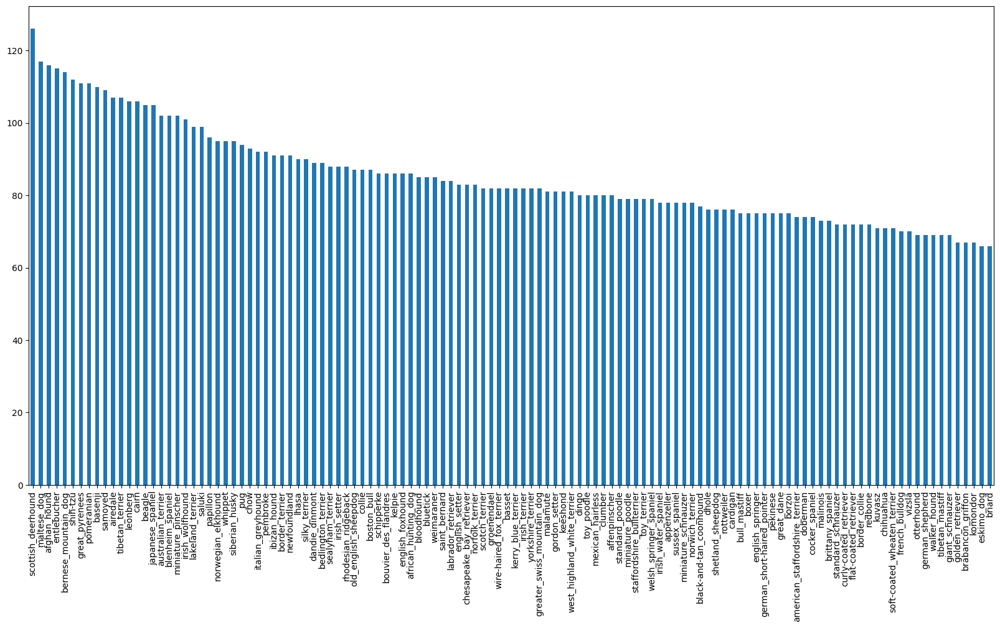

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10));

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

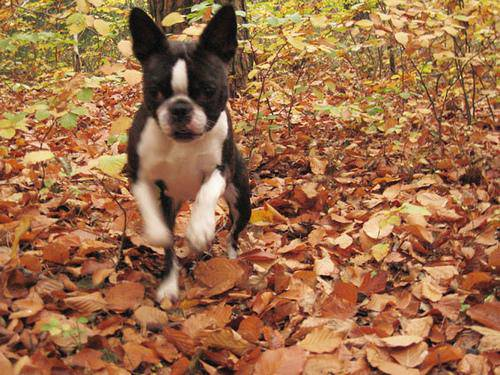

In [ ]:
# view an image
from IPython.display import Image
Image("/content/drive/MyDrive/DogBreed/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

### Getting Images and labels

get a list of image file pathnames

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Creat pathnames from image id's
filenames = ["/content/drive/MyDrive/DogBreed/train/"+fname+".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['/content/drive/MyDrive/DogBreed/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/DogBreed/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/DogBreed/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/DogBreed/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/DogBreed/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/DogBreed/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/DogBreed/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/DogBreed/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/DogBreed/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/DogBreed/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check wheter number of filenames matches of actual image files
import os
if len(os.listdir("/content/drive/MyDrive/DogBreed/train/")) == len(filenames):
    print("Filenames match actual amount of files !!!")
else:
    print("Filenames do not match actual amount of files, check the target dir")

Filenames do not match actual amount of files, check the target dir


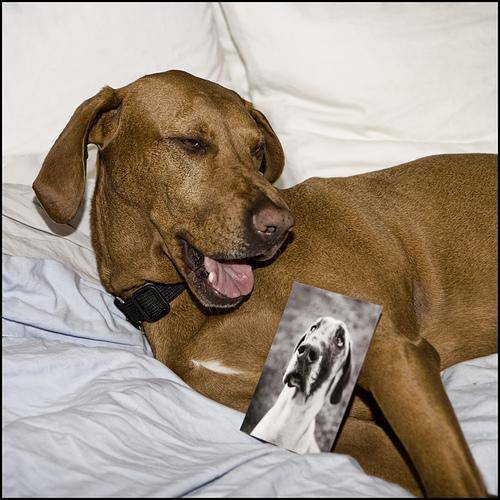

In [ ]:
Image(filenames[100])

In [ ]:
labels_csv["breed"][100]

'rhodesian_ridgeback'

In [ ]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
if len(labels) == len(filenames):
    print("Number of labels matches number of filename!")
else:
    print("No of labels doesn't match number of filenames")

Number of labels matches number of filename!


In [ ]:
# find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
#Turn a single label into an array of booleans
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
print(labels[0])
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating validation set

In [ ]:
X = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider",min:1000,max:10000,step:100}

In [ ]:
# split data
from sklearn.model_selection import train_test_split

#  split into training & validation of total size NUM_IMAGES
X_train,X_val,y_train,y_val = train_test_split(X[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=42)

len(X_train),len(X_val),len(y_train),len(y_val)

(800, 200, 800, 200)

In [ ]:
X_train[:2],y_train[:2]

(['/content/drive/MyDrive/DogBreed/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/DogBreed/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, Fal

## Preprocessing Images (turning images into Tensors)

In [ ]:
# Convert img to numpy
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(),image.min()

(255, 0)

In [ ]:
# turn img into tensors
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
# define image size
IMG_SIZE = 224

#for preprocessing images

def process_image(image_path,img_size=IMG_SIZE):
    # read an image file
    image = tf.io.read_file(image_path)
    # turn jpg img into numerical tensor with 3 colour channels (RGB)
    image = tf.image.decode_jpeg(image,channels=3)
    # convert the colour channel values from 0-255 to 0-1 values
    image = tf.image.convert_image_dtype(image,tf.float32)
    # resize the image
    image = tf.image.resize(image,size=[img_size,img_size])
    return image


## Turning data into batches

In [ ]:
# Create a function to return a tuple (image,label)
def get_image_label(image_path,label):
    image = process_image(image_path)
    return image,label

In [ ]:
(process_image(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
BATCH_SIZE  = 32

# Creat a function to turn data into batches
def create_data_batches(X,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
    # if data is a  test dataset
    if test_data:
        print("Creating test data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
        data_batch = data.map(process_image).batch(BATCH_SIZE)
        return data_batch
    # if data is a valid dataset , don't shuffle
    elif valid_data:
        print("Creating validation data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
        data_batch = data.map(get_image_label).batch(BATCH_SIZE)
        return data_batch
    else:
        print("Creating Training data batches...")
        # turn filepaths and labels into tensors
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
        # shuffling pathnames and labels before mapping image preproces func is faster than shuffling
        data = data.shuffle(buffer_size=len(X))
        # create (image,label) tuples (turns image path into preprocessed image)
        data = data.map(get_image_label)
        data_batch = data.batch(BATCH_SIZE)
        return data_batch


In [ ]:
# Creating training and training data batches
train_data = create_data_batches(X_train,y_train)
val_data = create_data_batches(X_val,y_val,valid_data=True)


Creating Training data batches...
Creating validation data batches...


In [ ]:
# check out the different attributes of data batches
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches

In [ ]:
import matplotlib.pyplot as plt

# Create a func for viewing imgs in a data batch
def show_25_images(images,labels):
    # setup the fig
    plt.figure(figsize=(10,10))
    for i in range(25):
        # create subplots (5 rows,5 col)
        ax = plt.subplot(5,5,i+1)
        # display an img
        plt.imshow(images[i])
        # add the image label as title
        plt.title(unique_breeds[labels[i].argmax()])
        # turn off grid lines
        plt.axis("off")

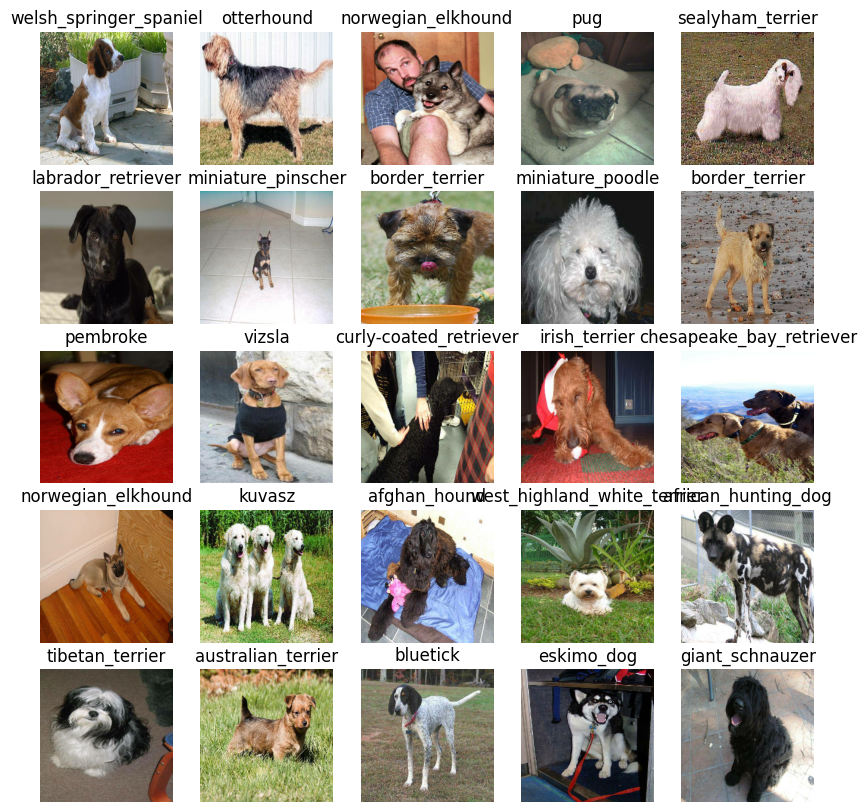

In [ ]:
train_images,train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images,train_labels)

## Building a model

In [ ]:
# Setup input shape of model
INPUT_SHAPE = [None,IMG_SIZE,IMG_SIZE,3]  # batch,height,width,colour channels

# Setup output shape of model
OUTPUT_SHAPE = len(unique_breeds)

# setup model url from tensorflow hub
MODEL_URL = "https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1"

In [ ]:
# Create a function which builds a Keras Model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
    print("Building model with : ",MODEL_URL)
    # Setup the model layers
    model = tf.keras.Sequential([
        hub.KerasLayer(MODEL_URL),
        tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                              activation="softmax"
                              )
    ])
    # compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=["accuracy"]
    )
    # build the model
    model.build(INPUT_SHAPE)
    return model

In [ ]:
model = create_model()
model.summary()

Building model with :  https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_4 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_4 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
outputs = np.ones(shape=(1,1,1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress ,check its progress or stop training early,
if a model stops improving.

## TensorBoard CallBack

In [ ]:
# load tensorboard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
import datetime
# Create a function to build a ternsorbaord callabck
def create_tensorboard_callback():
    # create a log dir for storing tensorboard logs
    logdir = os.path.join("drive/MyDrive/DogBreed/logs",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    return tf.keras.callbacks.TensorBoard(logdir)

## Early Stopping Callback

In [ ]:
# create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training A Model (on subset of data)

on 1000 images

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider",min:10,max:100,step:10}


In [ ]:
# function to train and return a trained model
def train_model():
    # Create a model
    model = create_model()
    # Create a new tensorboard session
    tensorboard = create_tensorboard_callback()
    # fit the model to data passing it the callbacks created
    model.fit(x=train_data,
              epochs=NUM_EPOCHS,
              validation_data=val_data,
              validation_freq=1,
              callbacks=[tensorboard,early_stopping]
              )
    return model

In [ ]:
# fit model to the data
model = train_model()

Building model with :  https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1
Epoch 1/100
25/25 [==============================] - 9s 223ms/step - loss: 4.5779 - accuracy: 0.0763 - val_loss: 3.3620 - val_accuracy: 0.2150
Epoch 2/100
25/25 [==============================] - 4s 155ms/step - loss: 1.6105 - accuracy: 0.6775 - val_loss: 2.1450 - val_accuracy: 0.5050
Epoch 3/100
25/25 [==============================] - 6s 227ms/step - loss: 0.5505 - accuracy: 0.9438 - val_loss: 1.6575 - val_accuracy: 0.5800
Epoch 4/100
25/25 [==============================] - 4s 161ms/step - loss: 0.2476 - accuracy: 0.9887 - val_loss: 1.4803 - val_accuracy: 0.6150
Epoch 5/100
25/25 [==============================] - 5s 188ms/step - loss: 0.1440 - accuracy: 0.9962 - val_loss: 1.4226 - val_accuracy: 0.6150
Epoch 6/100
25/25 [==============================] - 5s 181ms/step - loss: 0.0992 - accuracy: 1.0000 - val_loss: 1.3625 - val_accuracy: 0.6300
Epoch

### Checking Tensorboard logs


In [ ]:

%tensorboard --logdir /content/drive/MyDrive/DogBreed/logs
# !kill 20446

### Making and evaluating predictions using a trained model


In [ ]:
# Make predicitions on the validation data

predictions = model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 2s 162ms/step


array([[6.6987844e-04, 3.7566076e-06, 1.1387725e-04, ..., 3.0350461e-04,
        2.1871712e-05, 2.3965933e-03],
       [4.2734183e-03, 1.0724731e-04, 1.1899648e-02, ..., 3.0315388e-03,
        5.5126217e-03, 7.3324038e-05],
       [4.1438554e-05, 4.3909939e-05, 1.6670259e-05, ..., 9.7316179e-06,
        5.5859782e-06, 3.4169192e-05],
       ...,
       [1.9943023e-05, 5.8521575e-05, 2.9055931e-04, ..., 9.2051077e-06,
        5.0548470e-04, 1.0453543e-04],
       [1.1896542e-03, 7.1053248e-05, 5.1176557e-05, ..., 2.1403382e-04,
        5.4333341e-05, 8.5479617e-03],
       [3.1045842e-04, 5.5446864e-05, 4.5881511e-04, ..., 1.0417621e-03,
        1.7756947e-04, 1.6732640e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
# first prediction
index = 0
print(predictions[0])
print(f"Max value (probability of prediction) : {np.max(predictions[0])}")
print(f"Sum : {np.sum(predictions[index])}")
print(f"Max Index : {np.argmax(predictions[index])}")
print(f"Predictied label : {unique_breeds[np.argmax(predictions[index])]}")

[6.6987844e-04 3.7566076e-06 1.1387725e-04 1.8888482e-05 4.6459970e-04
 2.5026919e-05 1.5209272e-02 4.4493235e-04 1.4142861e-04 3.0430425e-03
 1.4470685e-04 5.6257537e-05 1.7816016e-04 3.4552300e-05 2.5481935e-05
 5.4018572e-04 1.3661777e-04 3.5048163e-01 1.1405414e-05 1.5648728e-05
 4.1206300e-04 1.3882360e-04 1.4609160e-05 1.0367199e-03 8.6736174e-05
 7.5556811e-05 2.9210451e-01 4.1737934e-05 3.8890197e-04 7.1850736e-05
 1.0346013e-04 2.5376759e-04 9.3569128e-05 1.4087164e-05 1.7070808e-04
 2.4130162e-02 7.6010215e-06 7.6240096e-05 2.6505237e-05 5.7193080e-05
 5.0803856e-04 4.5650618e-06 1.4499819e-04 1.8944442e-05 5.5542623e-06
 1.2215663e-04 9.9423733e-06 4.4603355e-05 2.4959361e-04 8.4316642e-05
 3.0654561e-04 1.4098562e-05 9.3019022e-05 8.9307068e-06 4.1880558e-05
 2.4884310e-05 5.7121400e-05 5.4303714e-04 2.4001303e-04 7.7869356e-02
 2.1222103e-04 6.1797637e-06 6.2966207e-04 1.1459711e-05 2.3381777e-05
 2.8107238e-03 2.1695067e-05 4.9975690e-05 4.3014204e-03 3.8263024e-05
 1.075

In [ ]:
# turn predicitons probabilities to their respective label
def get_pred_label(predicition_probabilities):
    return unique_breeds[np.argmax(predicition_probabilities)]
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

In [ ]:
# function to unbatch a batch dataset
def unbatchify(data):
    images=[]
    labels=[]
    # loop through unbatched data
    for image,label in data.unbatch().as_numpy_iterator():
        images.append(image)
        labels.append(unique_breeds[np.argmax(label)])
    return images,labels
val_images,val_labels=unbatchify(val_data)
val_images[0],val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

In [ ]:

images_ = []
labels_ = []
# loop through unbatched data
for image,label in val_data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(label)
images_[0],labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(labels_[0])

'cairn'

In [ ]:
def plot_pred(predicition_probabilities,labels,images,n=1):
    pred_prob,true_label,image = predicition_probabilities[n],labels[n],images[n]
    # get the pred label
    pred_label = get_pred_label(pred_prob)
    # plt img and remove ticks
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    # change the colour of title depending on if the prediction is right or wrong
    if pred_label == true_label:
        color="green"
    else:
        color="red"
    plt.title("{} {:2.0f}% {}".format(pred_label,np.max(pred_prob)*100,true_label),color=color)

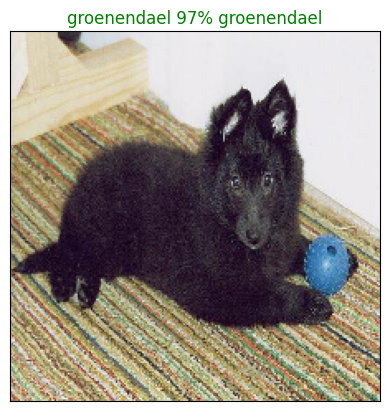

In [ ]:
plot_pred(predicition_probabilities=predictions,labels=val_labels,images=val_images,n=77)

In [ ]:
def plot_pred_conf(predicition_probabilities,labels,n=1):
    pred_prob,true_label = predicition_probabilities[n],labels[n]
    # get the pred label
    pred_label = get_pred_label(pred_prob)

    # find the top 10 prediction confidence indexes
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
    # find the top 10 prediction confidence values
    top_10_pred_values = pred_prob[top_10_pred_indexes]
    # find the top 10 prediction labels
    top_10_pred_labels = unique_breeds[top_10_pred_indexes]
    # setup plot
    top_plot = plt.bar(np.arange(len(top_10_pred_labels)),top_10_pred_values,color="grey")
    # plt img and remove ticks
    plt.xticks(np.arange(len(top_10_pred_labels)),labels=top_10_pred_labels,rotation="vertical")
    # change the color of true label
    if np.isin(true_label,top_10_pred_labels):
        top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
    else:
        pass


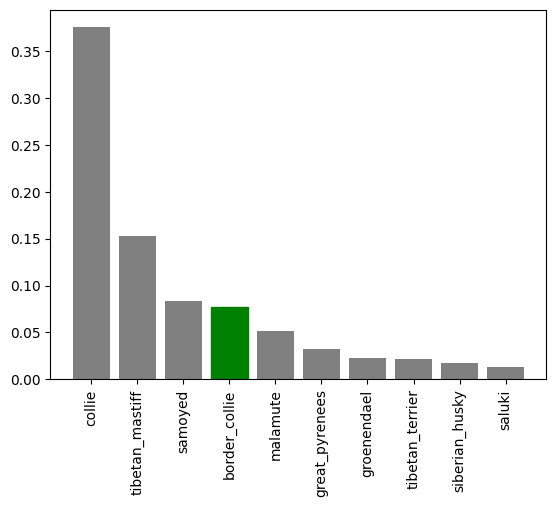

In [ ]:
plot_pred_conf(predicition_probabilities=predictions,labels=val_labels,n=9)

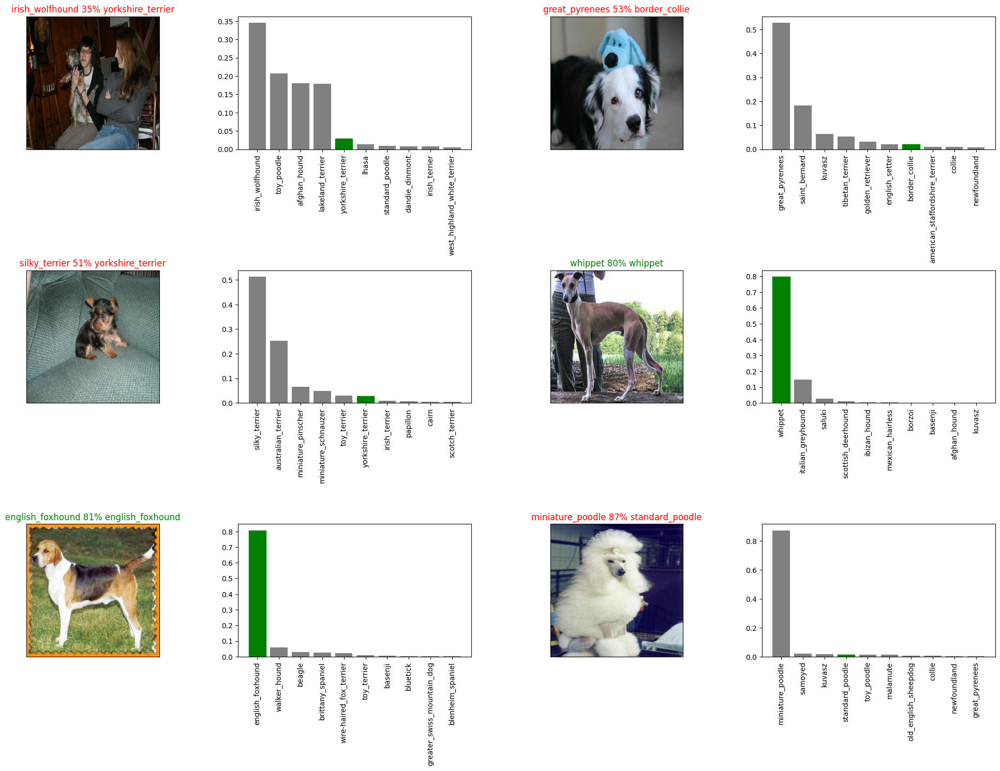

In [ ]:
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
    plt.subplot(num_rows,2*num_cols,2*i+1)
    plot_pred(predicition_probabilities=predictions,
              labels=val_labels,
              images=val_images,
              n=i+i_multiplier)
    plt.subplot(num_rows,2*num_cols,2*i+2)
    plot_pred_conf(predicition_probabilities=predictions,
                   labels=val_labels,
                   n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [ ]:
# create a function to save a model
def save_model(model,suffix=None):
    # Createa a model dir pathname with current time
    modeldir = os.path.join("drive/MyDrive/DogBreed/models",
                            datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
    model_path = modeldir + "-" + suffix + ".h5"
    print(f"Saving Model to : {model_path}...")
    model.save(model_path)
    return model_path

In [ ]:
def load_model(model_path):
    print(f"Loading saved model from : {model_path}")
    model = tf.keras.models.load_model(model_path,custom_objects={"KerasLayer":hub.KerasLayer})
    return model

In [ ]:
# save model trained on 1k images
save_model(model,suffix="1000-images-mobilenetv2-Adam")

Saving Model to : drive/MyDrive/DogBreed/models/20240203-21161706995012-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/DogBreed/models/20240203-21161706995012-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# load the model
loaded_1000_image_model = load_model("drive/MyDrive/DogBreed/models/20240203-19051706987112-1000-images-mobilenetv2-Adam.h5")

Loading saved model from : drive/MyDrive/DogBreed/models/20240203-19051706987112-1000-images-mobilenetv2-Adam.h5


In [ ]:
# evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 100ms/step - loss: 1.2272 - accuracy: 0.6750


[1.2271599769592285, 0.675000011920929]

In [ ]:
# evalute the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 97ms/step - loss: 1.2180 - accuracy: 0.6700


[1.2179551124572754, 0.6700000166893005]

## Training full dataset model

In [ ]:
len(X),len(y)

(10222, 10222)

In [ ]:
# create a data batch with full dataset
full_data = create_data_batches(X,y)

Creating Training data batches...


In [ ]:
len(full_data)

320

In [ ]:
# create a model for full model
full_model = create_model()

Building model with :  https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1


In [ ]:
#create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# no valid set when training on all data, so can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)

In [ ]:
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,
                          full_model_early_stopping])

Epoch 1/100


NotFoundError: Graph execution error:

Detected at node ReadFile defined at (most recent call last):
<stack traces unavailable>
Detected at node ReadFile defined at (most recent call last):
<stack traces unavailable>
2 root error(s) found.
  (0) NOT_FOUND:  /content/drive/MyDrive/DogBreed/train/dc1c430fe26e231d4c8e13d2ee14c5ad.jpg; No such file or directory
	 [[{{node ReadFile}}]]
	 [[IteratorGetNext]]
	 [[IteratorGetNext/_2]]
  (1) NOT_FOUND:  /content/drive/MyDrive/DogBreed/train/dc1c430fe26e231d4c8e13d2ee14c5ad.jpg; No such file or directory
	 [[{{node ReadFile}}]]
	 [[IteratorGetNext]]
0 successful operations.
0 derived errors ignored. [Op:__inference_train_function_162567]

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

In [ ]:
# Load in the full model
loaded_full_model = load_model('drive/MyDrive/DogBreed/models/20200205-07041580886291-full-image-set-mobilenetv2-Adam.h5')

### Making predictions on the test dataset

In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/DogBreed/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

NameError: name 'os' is not defined

In [ ]:
len(test_filenames)

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

In [ ]:
test_data

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
#np.savetxt("drive/My Drive/Dog Vision/preds_array.csv", test_predctions, delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/My Drive/DogBreeds/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

In [ ]:

test_predictions.shape

In [ ]:
# ["id"] + list(unique_breeds)

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/DogBreed/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

## Making predictions on custom images

In [ ]:
# Get custom image filepaths
custom_path = "drive/MyDrive/DogBreed/customimg/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

In [ ]:
custom_preds.shape

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)